# 🤖 Mr.HelpMate AI: Insurance Policy Question-Answering System

## 📘 Introduction

In today's complex insurance landscape, policy documents are often lengthy, filled with technical jargon, and structured in ways that can be challenging for the average policyholder to navigate. When customers have questions about their coverage, benefits, or exclusions, they typically resort to one of several suboptimal solutions:

1. 📞 Calling customer service and enduring long wait times  
2. 📄 Sifting through dense policy documents manually  
3. 🔍 Using basic search functionality that returns entire sections rather than specific answers  
4. ❓ Relying on simplified FAQs that may not address their specific concern  

This creates friction in the customer experience and increases operational costs for insurance providers who must maintain large customer service teams to handle repetitive queries.

**Mr.HelpMate AI** aims to solve this problem by creating an intelligent assistant that leverages recent advances in generative AI and retrieval-augmented generation (RAG) techniques. This system will enable policyholders to ask questions in natural language and receive accurate, contextually relevant answers extracted directly from their policy documents.

Unlike simple keyword search or traditional chatbots with predefined responses, **Mr.HelpMate AI** will understand the semantic meaning behind questions, retrieve the most relevant policy sections, and generate human-like responses that directly address the customer's query while maintaining factual accuracy by grounding all responses in the source documents.

## 🎯 Project Objectives

The primary goal of this project is to build a robust generative search system capable of effectively and accurately answering questions from insurance policy documents. Specifically, we aim to:

1. 🛠️ **Develop an efficient document processing pipeline** that can ingest, parse, and index insurance policy documents while preserving their semantic structure and relationships.

2. 🔎 **Implement a retrieval system** that accurately identifies the most relevant sections of a policy document in response to user queries.

3. 🧠 **Create a generative component** that produces clear, concise, and accurate answers based on the retrieved document sections.

4. ✅ **Ensure factual grounding** by developing techniques to verify that all generated answers are supported by the source document and contain no hallucinated information.

5. 📏 **Design an evaluation framework** to measure the system's performance in terms of answer relevance, factual accuracy, completeness, and clarity.

6. 💬 **Optimize the user experience** by creating a simple, intuitive interface that allows users to interact with the system through natural language questions.

7. 🚫 **Implement safeguards** to identify questions that cannot be reliably answered based on the available policy documents and provide appropriate disclaimers.

This project will synthesize techniques from natural language processing, information retrieval, and generative AI to create a practical solution that improves customer satisfaction, reduces operational costs for insurers, and demonstrates the potential of RAG systems in specialized domains with strict accuracy requirements.

By successfully completing this project, we will not only create a valuable tool for insurance customers but also develop a framework that can be extended to other document-intensive domains such as 📜 legal contracts, 💼 financial agreements, and 📚 technical documentation.


## 🔍 Flowchart Overview: Building a Document-Based LLM Search System

The flowchart illustrates a three-layer architecture that powers a document-based search system using a Large Language Model (LLM). The system is modular and emphasizes experimentation across all layers to optimize relevance and response quality.

1. **🧠 Embedding Layer:**  
   This is the foundational step where both the documents and user queries are converted into vector embeddings using pre-trained embedding models (e.g., OpenAI, Hugging Face). These embeddings capture semantic meaning, enabling effective similarity comparisons. Experimentation here could involve testing different embedding models, chunking strategies, or metadata augmentation.

2. **🔎 Search Layer:**  
   Once embedded, the system performs a similarity search in the vector store (e.g., FAISS, Chroma) to retrieve the most relevant document chunks. This step ensures only contextually relevant content is passed to the LLM. Experimentation may include different distance metrics (cosine, dot product), hybrid search techniques (BM25 + vectors), and filtering using metadata.

3. **🧾 Generation Layer:**  
   The selected documents, along with the user's query, are passed to the LLM as part of a prompt. The model then generates a natural language response. This layer can be enhanced by prompt engineering, using custom instructions, or incorporating tools like retrieval-augmented generation (RAG).

Together, these layers form a flexible and powerful semantic search pipeline.


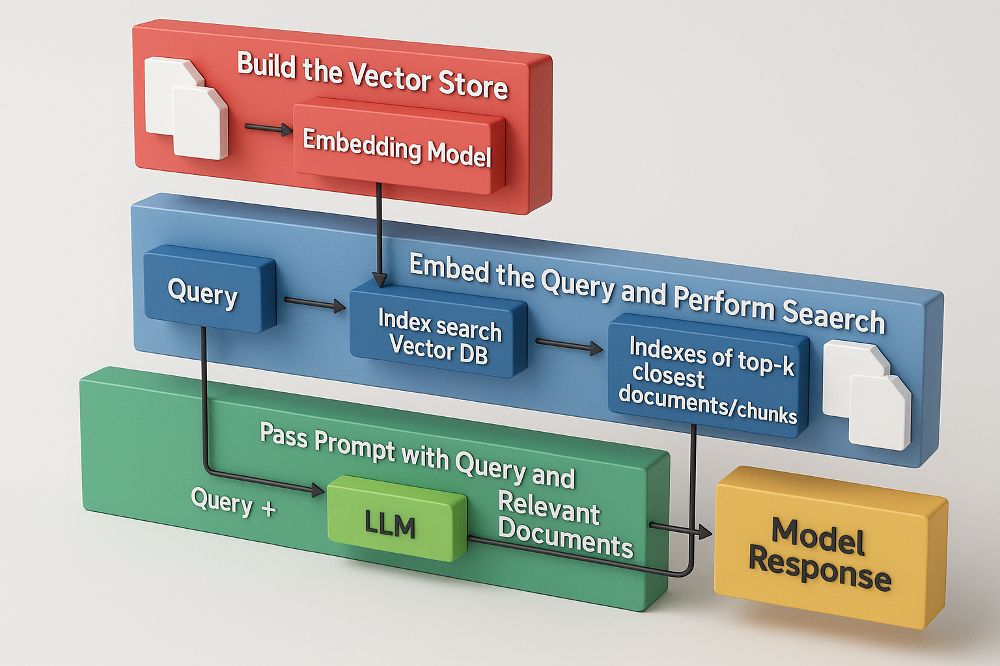

In [1]:
from IPython.display import Image, display

image_path = "/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/A_Flowchart_Digital_Diagram_Demonstrates_Building_HelpMate_AI_Project.png"
display(Image(image_path))

## 1️⃣ <font color = skyblue> Install and Load Necessary Libraries

In [2]:
# Install all the required libraries
# !pip install google-generativeai pinecone-client pdfplumber openai sentence-transformers
!pip install pdfplumber tiktoken openai chromaDB sentence-transformers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.2/60.2 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 55.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.0/19.0 MB 73.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 52.6 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4

In [3]:
# Import all the required Libraries
import pandas as pd
import pdfplumber
from pathlib import Path
from operator import itemgetter
import os
import json
import openai
import chromadb
from kaggle_secrets import UserSecretsClient

In [4]:
user_secrets = UserSecretsClient()
openai.api_key = user_secrets.get_secret("OPENAI_API_KEY")

# 🚀 Stage 1: Embedding Layer
The embedding layer transforms text into numerical vectors that capture semantic meaning. Using advanced transformer models, this stage converts documents into high-dimensional representations where similar concepts occupy nearby positions in vector space. Our system processes document chunks strategically, preserving contextual relationships while optimizing for retrieval efficiency. 

These dense embeddings enable the system to understand conceptual similarities regardless of specific terminology, forming the foundation for semantic search and knowledge extraction capabilities. By mathematically encoding document meaning, the embedding layer creates a sophisticated representation that powers all subsequent processing stages in our document understanding pipeline. 

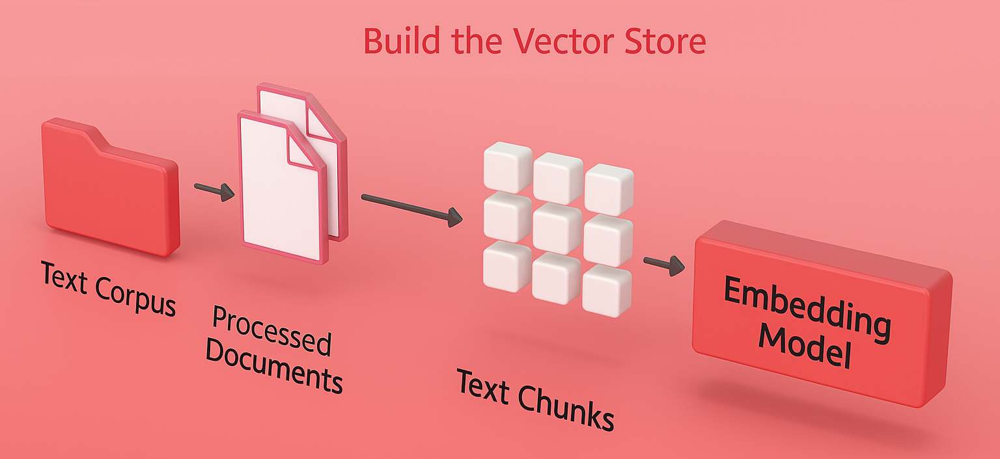

In [5]:
image_path = "/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/Stage_1_Embedding Layer.png"
display(Image(image_path))

## 2️⃣ <font color = skyblue> Read, Process, and Chunk the PDF Files

We'll use pdfplumber for PDF extraction and processing, which offers several advantages over simpler PDF libraries. pdfplumber provides robust capabilities for extracting structured content from PDFs, including:

Text extraction with positional data
Table detection and extraction
Form field identification
Image extraction capabilities
Visual debugging tools for development

This library allows us to handle complex document structures by preserving the spatial relationships between text elements, which is crucial for maintaining document context during chunking. It also provides methods to extract text while preserving formatting elements like paragraphs, headers, and lists.
For optimal retrieval performance, we'll implement a strategic chunking approach that balances chunk size with semantic coherence, ensuring that related content stays together while creating chunks that are appropriately sized for our vector database.

In [6]:
# Use this path to fetch the dataset from the "helpmate ai" directory
pdf_path = '/kaggle/input/helpmate-ai/'
for dirname, _, filenames in os.walk(pdf_path):
    for filename in filenames:
        print("PDF Path 1: ", os.path.join(dirname, filename))


# Use this path to fetch the dataset from the "av ms helpmate ai sample insurance policy pdf" directory
pdf_path_2 = '/kaggle/input/av-ms-helpmate-ai-sample-insurance-policy-pdf/'
for dirname, _, filenames in os.walk(pdf_path_2):
    for filename in filenames:
        print("PDF Path 2: ", os.path.join(dirname, filename))

# # Use this path to fetch the dataset from the "Flowchart Diagram - HelpMate AI Project" directory
# pdf_path_3 = '/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/'
# for dirname, _, filenames in os.walk(pdf_path_3):
#     for filename in filenames:
#         print("PDF Path 3: ", os.path.join(dirname, filename))

PDF Path 1:  /kaggle/input/helpmate-ai/Principal-Sample-Life-Insurance-Policy.pdf
PDF Path 2:  /kaggle/input/av-ms-helpmate-ai-sample-insurance-policy-pdf/Principal-Sample-Life-Insurance-Policy.pdf


In [7]:
# Function to check whether a word is present in a table or not for segregation of regular text and tables
def check_bboxes(word, table_bbox):
    # Check whether word is inside a table bbox.
    l = word['x0'], word['top'], word['x1'], word['bottom']
    r = table_bbox
    return l[0] > r[0] and l[1] > r[1] and l[2] < r[2] and l[3] < r[3]

In [8]:
# Function to extract text from a PDF file.
# 1. Declare a variable p to store the iteration of the loop that will help us store page numbers alongside the text
# 2. Declare an empty list 'full_text' to store all the text files
# 3. Use pdfplumber to open the pdf pages one by one
# 4. Find the tables and their locations in the page
# 5. Extract the text from the tables in the variable 'tables'
# 6. Extract the regular words by calling the function check_bboxes() and checking whether words are present in the table or not
# 7. Use the cluster_objects utility to cluster non-table and table words together so that they retain the same chronology as in the original PDF
# 8. Declare an empty list 'lines' to store the page text
# 9. If a text element in present in the cluster, append it to 'lines', else if a table element is present, append the table
# 10. Append the page number and all lines to full_text, and increment 'p'
# 11. When the function has iterated over all pages, return the 'full_text' list

def extract_text_from_pdf(pdf_path):
    p = 0
    full_text = []


    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            page_no = f"Page {p+1}"
            text = page.extract_text()

            tables = page.find_tables()
            table_bboxes = [i.bbox for i in tables]
            tables = [{'table': i.extract(), 'top': i.bbox[1]} for i in tables]
            non_table_words = [word for word in page.extract_words() if not any(
                [check_bboxes(word, table_bbox) for table_bbox in table_bboxes])]
            lines = []

            for cluster in pdfplumber.utils.cluster_objects(non_table_words + tables, itemgetter('top'), tolerance=5):

                if 'text' in cluster[0]:
                    try:
                        lines.append(' '.join([i['text'] for i in cluster]))
                    except KeyError:
                        pass

                elif 'table' in cluster[0]:
                    lines.append(json.dumps(cluster[0]['table']))


            full_text.append([page_no, " ".join(lines)])
            p +=1

    return full_text

*Now that we have defined the function for extracting the text and tables from a PDF, let's iterate and call this function for all the PDFs in our drive and store them in a list.*

In [9]:
# Define the directory containing the PDF files
pdf_directory = Path(pdf_path)

# Initialize an empty list to store the extracted texts and document names
data = []

# Loop through all files in the directory
for pdf_path in pdf_directory.glob("*.pdf"):

    # Process the PDF file
    print(f"...Processing {pdf_path.name}")

    # Call the function to extract the text from the PDF
    extracted_text = extract_text_from_pdf(pdf_path)

    # Convert the extracted list to a PDF, and add a column to store document names
    extracted_text_df = pd.DataFrame(extracted_text, columns=['Page No.', 'Page_Text'])
    extracted_text_df['Document Name'] = pdf_path.name

    # Append the extracted text and document name to the list
    data.append(extracted_text_df)

    # Print a message to indicate progress
    print(f"Finished processing {pdf_path.name}")

# Print a message to indicate all PDFs have been processed
print("All PDFs have been processed.")

...Processing Principal-Sample-Life-Insurance-Policy.pdf
Finished processing Principal-Sample-Life-Insurance-Policy.pdf
All PDFs have been processed.


In [10]:
# Concatenate all the DFs in the list 'data' together
insurance_pdfs_data = pd.concat(data, ignore_index=True)

In [11]:
print("Shape of the data is :: ", insurance_pdfs_data.shape, "\n")

insurance_pdfs_data.sample(2)

Shape of the data is ::  (64, 3) 



,Page No.,Page_Text,Document Name
48,Page 49,Payment of benefits will be subject to the Ben...,Principal-Sample-Life-Insurance-Policy.pdf
1,Page 2,This page left blank intentionally,Principal-Sample-Life-Insurance-Policy.pdf


In [12]:
# Let's also check the length of all the texts as there might be some empty pages or pages with very few words that we can drop
insurance_pdfs_data['Text_Length'] = insurance_pdfs_data['Page_Text'].apply(lambda x: len(x.split(' ')))

insurance_pdfs_data.sample(2)

,Page No.,Page_Text,Document Name,Text_Length
46,Page 47,"M ember's death, the Death Benefits Payable ma...",Principal-Sample-Life-Insurance-Policy.pdf,391
35,Page 36,A Member's insurance under this Group Policy f...,Principal-Sample-Life-Insurance-Policy.pdf,333


In [13]:
print("-"*50)
print("Maximum Text Length is :: ", max(insurance_pdfs_data['Text_Length']))
print("-"*50)
print("Minimum Text Length is :: ", min(insurance_pdfs_data['Text_Length']))
print("-"*50)

--------------------------------------------------
Maximum Text Length is ::  462
--------------------------------------------------
Minimum Text Length is ::  5
--------------------------------------------------


To skip pages that are essentially blank—either containing fewer than 10 words or consisting solely of a header or footer—we use the following code to filter them out during processing.

In [14]:
# Retain only the rows with a text length of at least 10
insurance_pdfs_data = insurance_pdfs_data.loc[insurance_pdfs_data['Text_Length'] >= 10]

print("Shape of the data is :: ", insurance_pdfs_data.shape, "\n")

insurance_pdfs_data.head()

Shape of the data is ::  (60, 4) 



,Page No.,Page_Text,Document Name,Text_Length
0,Page 1,DOROTHEA GLAUSE S655 RHODE ISLAND JOHN DOE 01/...,Principal-Sample-Life-Insurance-Policy.pdf,30
2,Page 3,POLICY RIDER GROUP INSURANCE POLICY NO: S655 C...,Principal-Sample-Life-Insurance-Policy.pdf,230
4,Page 5,PRINCIPAL LIFE INSURANCE COMPANY (called The P...,Principal-Sample-Life-Insurance-Policy.pdf,110
5,Page 6,TABLE OF CONTENTS PART I - DEFINITIONS PART II...,Principal-Sample-Life-Insurance-Policy.pdf,153
6,Page 7,Section A – Eligibility Member Life Insurance ...,Principal-Sample-Life-Insurance-Policy.pdf,176


In [15]:
# Store the metadata for each page in a separate column
insurance_pdfs_data['Metadata'] = insurance_pdfs_data.apply(lambda x: {'Policy_Name': x['Document Name'][:-4], 'Page_No.': x['Page No.']}, axis=1)

print("Shape of the data is :: ", insurance_pdfs_data.shape, "\n")

insurance_pdfs_data.head()

Shape of the data is ::  (60, 5) 



,Page No.,Page_Text,Document Name,Text_Length,Metadata
0,Page 1,DOROTHEA GLAUSE S655 RHODE ISLAND JOHN DOE 01/...,Principal-Sample-Life-Insurance-Policy.pdf,30,{'Policy_Name': 'Principal-Sample-Life-Insuran...
2,Page 3,POLICY RIDER GROUP INSURANCE POLICY NO: S655 C...,Principal-Sample-Life-Insurance-Policy.pdf,230,{'Policy_Name': 'Principal-Sample-Life-Insuran...
4,Page 5,PRINCIPAL LIFE INSURANCE COMPANY (called The P...,Principal-Sample-Life-Insurance-Policy.pdf,110,{'Policy_Name': 'Principal-Sample-Life-Insuran...
5,Page 6,TABLE OF CONTENTS PART I - DEFINITIONS PART II...,Principal-Sample-Life-Insurance-Policy.pdf,153,{'Policy_Name': 'Principal-Sample-Life-Insuran...
6,Page 7,Section A – Eligibility Member Life Insurance ...,Principal-Sample-Life-Insurance-Policy.pdf,176,{'Policy_Name': 'Principal-Sample-Life-Insuran...


This wraps up the chunking process. As observed, most pages in the insurance documents contain a few hundred words, rarely exceeding 1000. Therefore, further chunking is unnecessary—we can perform embeddings at the page level. This approach is effective for two key reasons:

1. Insurance documents are typically well-structured, meaning the content within a page is usually coherent and contextually related.
2. Using larger chunks ensures we retain more contextual information, which is beneficial for the LLM during the generation stage.


Here are some **different approaches for chunking** documents, each suited for specific use cases depending on the structure of the content and the downstream tasks (like retrieval or generation):

---

### 📄 1. **Fixed-Length Chunking**

* **Description**: Break text into chunks of a fixed number of tokens (e.g., 500 tokens per chunk).
* **Pros**: Simple to implement; consistent size for model input.
* **Cons**: May split sentences or lose semantic boundaries.

---

### 📏 2. **Sliding Window Chunking**

* **Description**: Use overlapping chunks where each new chunk starts before the previous one ends (e.g., 500 tokens with a 100-token overlap).
* **Pros**: Maintains context across boundaries; reduces loss of continuity.
* **Cons**: Increases redundancy and storage.

---

### 🧩 3. **Semantic Chunking**

* **Description**: Use NLP techniques (e.g., sentence segmentation, topic modeling) to chunk by meaning or topic coherence.
* **Pros**: Preserves semantic integrity; ideal for LLM input.
* **Cons**: More complex; may result in variable chunk sizes.

---

### 🗂️ 4. **Header/Footer or Section-Based Chunking**

* **Description**: Split content based on document structure like headings, paragraphs, or predefined sections.
* **Pros**: Works well for structured documents (e.g., policies, legal).
* **Cons**: Depends on consistent formatting.

---

### 📚 5. **Page-Level Chunking**

* **Description**: Treat each page as a separate chunk (used often in PDF/insurance documents).
* **Pros**: Easy to align with source documents; preserves visual context.
* **Cons**: May vary greatly in word count or relevance.

---

### 🧠 6. **Hybrid Chunking**

* **Description**: Combine two or more methods (e.g., semantic + sliding window) for optimal results.
* **Pros**: Flexible and adaptable to content.
* **Cons**: Requires more tuning and logic.

---

## 3️⃣ <font color = skyblue> Generate and Store Embeddings using OpenAI and ChromaDB

This stage transforms our text chunks into numerical vector representations using OpenAI's `text-embedding-ada-002` model. Each document fragment is encoded into a high-dimensional embedding that captures its semantic essence. 

We then persist these vectors in ChromaDB, a specialized vector database optimized for similarity search operations. This combination provides an efficient architecture for storing and retrieving documents based on meaning rather than keywords. The ChromaDB collection creates a searchable semantic index of our content, enabling natural language queries to find contextually relevant information even when exact terminology differs between query and documents.

In [16]:
# Import the OpenAI Embedding Function into chroma
from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

The `chromadb.PersistentClient` in **ChromaDB** is a client class used to manage a **persistent vector database**—meaning that your collections and embeddings are **saved to disk** and **not lost** after your script or notebook ends.

### ✅ Meaning & Purpose:

`PersistentClient` enables **persistent storage** by writing the data to files (typically using **DuckDB and Parquet** under the hood). This is in contrast to the default in-memory client which loses all data when the program ends.

---

### 🧠 Typical Usage Example:

```python
import chromadb

client = chromadb.PersistentClient(path="/path/to/chroma_db")

collection = client.get_or_create_collection(name="my_collection")

collection.add(
    documents=["This is a test document"],
    ids=["doc1"]
)
```

* `path` is where the data is stored (e.g., on disk in a directory).
* The next time you initialize a `PersistentClient` with the same path, your data will be loaded again.

---

### 🔁 Why Use `PersistentClient`?

* **Data survives kernel restarts**
* Ideal for large-scale or long-term applications
* Useful in notebooks (like Kaggle, Colab) if you want to **cache or re-use** computed embeddings without reprocessing

---

### 🚫 When **not** to use:

If you only need temporary data (e.g., during one-time experimentation), the default `chromadb.Client()` is simpler.

Let me know if you want help setting this up in a specific environment like Kaggle or Colab.


In [17]:
# Define the path where chroma collections will be stored
chroma_data_path = "/kaggle/working/chroma_db"

client = chromadb.PersistentClient(path=chroma_data_path)

In [18]:
# Set up the embedding function using the OpenAI embedding model
model = "text-embedding-3-small"
embedding_function = OpenAIEmbeddingFunction(api_key=openai.api_key, model_name=model)

In [19]:
from chromadb.utils import embedding_functions

sentence_transformer_ef = embedding_functions.SentenceTransformerEmbeddingFunction(model_name="all-mpnet-base-v2")

2025-05-22 05:48:05.802136: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747892886.072214      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747892886.151981      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [20]:
# Convert the page text and metadata from your dataframe to lists to be able to pass it to chroma

documents_list = insurance_pdfs_data["Page_Text"].tolist()
metadata_list = insurance_pdfs_data['Metadata'].tolist()

In [21]:
# Initialise a collection in chroma and pass the embedding_function to it so that it used OpenAI embeddings to embed the documents

insurance_collection = client.get_or_create_collection(name='RAG_on_Insurance', embedding_function=embedding_function)

In [22]:
# Add the documents and metadata to the collection alongwith generic integer IDs. You can also feed the metadata information as IDs by combining the policy name and page no.

insurance_collection.add(
    documents= documents_list,
    ids = [str(i) for i in range(0, len(documents_list))],
    metadatas = metadata_list
)

In [23]:
# Let's take a look at the first few entries in the collection

insurance_collection.get(
    ids = ['0','1','2'],
    include = ['embeddings', 'documents', 'metadatas']
)

{'ids': ['0', '1', '2'],
 'embeddings': array([[ 0.02405244, -0.00258815,  0.05456119, ...,  0.00448833,
         -0.01202622, -0.01772842],
        [ 0.02750516,  0.02626047,  0.04568736, ...,  0.00913991,
         -0.00304155, -0.00285088],
        [ 0.02289954,  0.02201879,  0.05541594, ...,  0.0278984 ,
          0.01059282,  0.00306478]]),
 'documents': ['DOROTHEA GLAUSE S655 RHODE ISLAND JOHN DOE 01/01/2014 711 HIGH STREET GEORGE RI 02903 GROUP POLICY FOR: RHODE ISLAND JOHN DOE ALL MEMBERS Group Member Life Insurance Print Date: 07/16/2014',
  'POLICY RIDER GROUP INSURANCE POLICY NO: S655 COVERAGE: Life EMPLOYER: RHODE ISLAND JOHN DOE Effective on the later of the Date of Issue of this Group Policy or March 1, 2005, the following will apply to your Policy: From time to time The Principal may offer or provide certain employer groups who apply for coverage with The Principal a Financial Services Hotline and Grief Support Services or any other value added service for the employees o

In [24]:
cache_collection = client.get_or_create_collection(name='Insurance_Cache', embedding_function=embedding_function)

In [25]:
cache_collection.peek()

{'ids': [],
 'embeddings': array([], dtype=float64),
 'documents': [],
 'uris': None,
 'included': ['metadatas', 'documents', 'embeddings'],
 'data': None,
 'metadatas': []}

Once the text within the documents has been pre-processed and chunked, the next step is to convert it into vector representations using an appropriate text embedding model. Previously, we used the `sentence-transformers` library with the `all-mpnet-base-v2` model for this purpose. In this demonstration, we switch to **OpenAI’s `text-embedding-3-small` model**, which transforms text into dense vector embeddings. These embeddings are generated using ChromaDB’s utility functions that support OpenAI's models.

🔗 For more details, refer to: [https://docs.trychroma.com/embeddings](https://docs.trychroma.com/embeddings)

After generating the embeddings, we store them in a vector database—in this case, **ChromaDB**. As discussed earlier, ChromaDB requires collections to store data. The `get_or_create_collection` method is used to either fetch an existing collection or create a new one. Since we are using a custom embedding model (OpenAI) instead of Chroma's default, we must pass the embedding function explicitly when creating the collection.

Once the collection is set up, we insert the documents along with their corresponding text and metadata. Additionally, we’ve also created a separate Chroma collection to serve as a **cache layer**, which will be covered in the next segment.


# 🔎 Stage 2: <font color = skyblue> Semantic Search with Cache Layer

This section covers how semantic search is performed using a cache layer for improved efficiency. When a query is made, the system first searches the cache for top-k semantically similar documents or chunks. If found, results are returned instantly. If not, the query is processed using the main vector database. 

The system then stores the new query and its results in the cache for faster future retrieval. This approach reduces latency for repeated or similar queries by avoiding redundant computation and enables quicker access to relevant documents through efficient indexing and retrieval from the vector store.

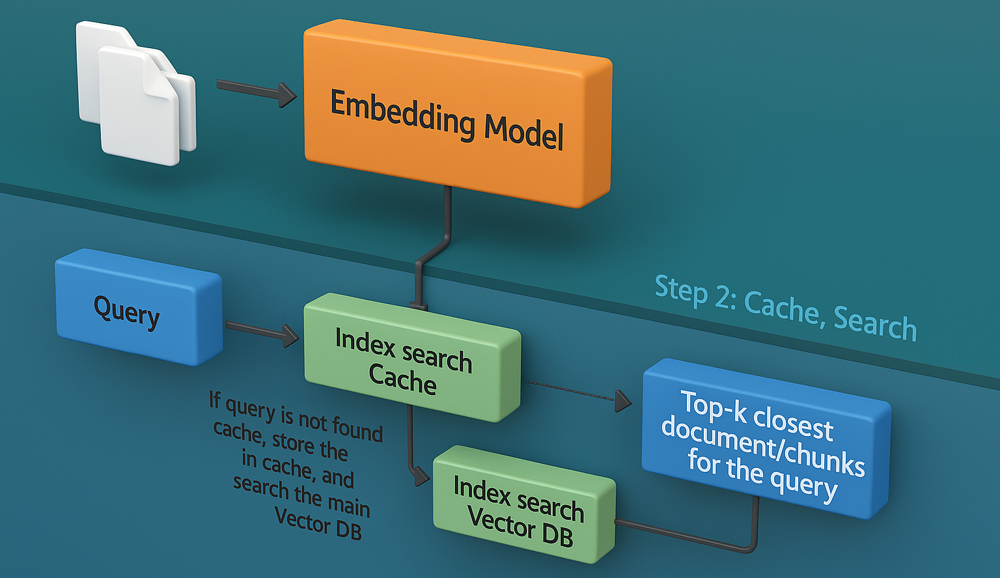

In [26]:
image_path = "/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/Stage_2_Search Layer.png"
display(Image(image_path))

### **QnA - Query 1**

In [27]:
# ------------------------------------------------------------------------------
# Question 1 : Can insurance coverage continue during an approved leave?
# ------------------------------------------------------------------------------

# Read the user query
# query = input()
query = "Can insurance coverage continue during an approved leave?"

In [28]:
# Searh the Cache collection first
# Query the collection against the user query and return the top 20 results

cache_results = cache_collection.query(
    query_texts=query,
    n_results=1
)

cache_results

{'ids': [[]],
 'embeddings': None,
 'documents': [[]],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[]],
 'distances': [[]]}

In [29]:
results = insurance_collection.query(
    query_texts=query,
    n_results=10
)
results.items()

dict_items([('ids', [['37', '35', '38', '46', '25', '33', '29', '4', '34', '30']]), ('embeddings', None), ('documents', [["Section E - Reinstatement Article 1 - Reinstatement A Member's terminated insurance will be reinstated if: a. insurance ceased because of layoff or approved leave of absence; and b. the Member returns to Active Work for the Policyholder within six months of the date insurance ceased. The Member's reinstated insurance will be in force on the date of return to work. However, the Actively at Work and Period of Limited Activity provisions discussed in PART III, Section B, will apply. Also, Proof of Good Health will be required to place in force any Scheduled Benefit that would have been subject to Proof of Good Health had the Member remained continuously insured. Only the period of time during which a Member is actually insured will be included in determining the length of his or her continuous coverage under this Group Policy. For this purpose the period of time durin

In [30]:
# Implementing Cache in Semantic Search

# Set a threshold for cache searchA
threshold = 0.2

ids = []
documents = []
distances = []
metadatas = []
results_df = pd.DataFrame()


# If the distance is greater than the threshold, then return the results from the main collection.

if cache_results['distances'][0] == [] or cache_results['distances'][0][0] > threshold:
    # Query the collection against the user query and return the top 10 results
    results = insurance_collection.query(
    query_texts=query,
    n_results=10
    )
    
    # Store the query in cache_collection as document w.r.t to ChromaDB so that it can be embedded and searched against later
    # Store retrieved text, ids, distances and metadatas in cache_collection as metadatas, so that they can be fetched easily if a query indeed matches to a query in cache
    Keys = []
    Values = []

    for key, val in results.items():
        # print(f"Key: {key}, Type of val: {type(val)}, Length of val: {len(val) if val else 0}")
        if val is None:
        	continue
        if key != 'embeddings':
        	# Ensure val[0] exists and is a list-like object
        	if len(val) > 0 and isinstance(val[0], (list, tuple)):
        		for i in range(min(10, len(val[0]))):  # Avoid IndexError
        			Keys.append(str(key) + str(i))
        			Values.append(str(val[0][i]))
        	else:
        		# Optional: log or handle unexpected structure
        		print(f"Skipping key: {key}, unexpected structure: {type(val[0]) if val else 'empty'}")

    cache_collection.add(
      documents= [query],
      ids = [query],  # Or if you want to assign integers as IDs 0,1,2,.., then you can use "len(cache_results['documents'])" as will return the no. of queries currently in the cache and assign the next digit to the new query."
      metadatas = dict(zip(Keys, Values))
    )

    print("Not found in cache. Found in main collection.")
    
    result_dict = {'Metadatas': results['metadatas'][0], 'Documents': results['documents'][0], 'Distances': results['distances'][0], "IDs":results["ids"][0]}
    results_df = pd.DataFrame.from_dict(result_dict)
    results_df

elif cache_results['distances'][0][0] <= threshold:
    cache_result_dict = cache_results['metadatas'][0][0]

    # Loop through each inner list and then through the dictionary
    for key, value in cache_result_dict.items():
        if 'ids' in key:
            ids.append(value)
        elif 'documents' in key:
            documents.append(value)
        elif 'distances' in key:
            distances.append(value)
        elif 'metadatas' in key:
            metadatas.append(value)

    print("Found in cache!")

    # Create a DataFrame
    results_df = pd.DataFrame({
        'IDs': ids,
        'Documents': documents,
        'Distances': distances,
        'Metadatas': metadatas
    })


Skipping key: included, unexpected structure: <class 'str'>
Not found in cache. Found in main collection.


In [31]:
results_df

,Metadatas,Documents,Distances,IDs
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section E - Reinstatement Article 1 - Reinstat...,0.706852,37
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section D - Continuation Article 1 - Member Li...,0.725815,35
2,{'Policy_Name': 'Principal-Sample-Life-Insuran...,I f coverage for a Member or Dependent termina...,0.869949,38
3,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi...",Payment of benefits will be subject to the Ben...,0.932137,46
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section B - Effective Dates Article 1 - Member...,0.956336,25
5,{'Policy_Name': 'Principal-Sample-Life-Insuran...,A Member's insurance under this Group Policy f...,0.980352,33
6,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) marriage or establishment of a Civil Union...,1.000119,29
7,"{'Page_No.': 'Page 7', 'Policy_Name': 'Princip...",Section A – Eligibility Member Life Insurance ...,1.011856,4
8,"{'Page_No.': 'Page 37', 'Policy_Name': 'Princi...",b. a business assignment; or c. full-time stud...,1.012933,34
9,"{'Page_No.': 'Page 33', 'Policy_Name': 'Princi...",a . In no event will Dependent Life Insurance ...,1.021472,30


### **QnA - Query 2**

In [32]:
# ------------------------------------------------------------------------------
# Question 2 : Are there age-based reductions in benefit amounts?
# ------------------------------------------------------------------------------

# Read the user query
# query2 = input()
query2 = "Are there age-based reductions in benefit amounts?"

In [33]:
# Searh the Cache collection first
# Query the collection against the user query and return the top 20 results

cache_results2 = cache_collection.query(
    query_texts=query2,
    n_results=1
)

cache_results2

{'ids': [['Can insurance coverage continue during an approved leave?']],
 'embeddings': None,
 'documents': [['Can insurance coverage continue during an approved leave?']],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'documents1': "Section D - Continuation Article 1 - Member Life Insurance a. Sickness or Injury (Other Than ADL Disability or Total Disability) If Active Work ends because a Member is sick or injured but not ADL Disabled or Totally Disabled, insurance for that Member may be continued until the earlier of: (1) the date insurance would otherwise cease as provided in PART III, Section C; or (2) the date the Member recovers. b. Layoff or Approved Leave of Absence If Active Work ends because a Member is on layoff or approved leave of absence, insurance for that Member may be continued until the earliest of: (1) the date insurance would otherwise cease as provided in PART III, Section C, Article 1 a. through g.; or (2) the

In [34]:
# Implementing Cache in Semantic Search

# Set a threshold for cache search
threshold = 0.2

# Initialize lists and dataframe
ids2 = []
documents2 = []
distances2 = []
metadatas2 = []
results_df2 = pd.DataFrame()

# Check if cache is empty or not useful
if not cache_results2['distances'][0] or cache_results2['distances'][0][0] > threshold:
    # Query the main collection
    results = insurance_collection.query(
        query_texts=query2,
        n_results=10
    )

    # Prepare metadata for caching
    Keys2 = []
    Values2 = []

    for key, val in results.items():
        if val is None or key == 'embeddings':
            continue
        if len(val) > 0 and isinstance(val[0], (list, tuple)):
            for i in range(min(10, len(val[0]))):
                Keys2.append(f"{key}{i}")
                Values2.append(str(val[0][i]))
        else:
            print(f"Skipping key '{key}' due to unexpected structure or empty list.")

    # Add to cache
    cache_collection.add(
        documents=[query2],
        ids=[query2],
        metadatas=dict(zip(Keys2, Values2))
    )

    print("Not found in cache. Found in main collection.")

    # Prepare result DataFrame
    result_dict2 = {
        'Metadatas': results['metadatas'][0],
        'Documents': results['documents'][0],
        'Distances': results['distances'][0],
        'IDs': results['ids'][0]
    }
    results_df2 = pd.DataFrame.from_dict(result_dict2)

# Use cached results
elif cache_results2['distances'][0][0] <= threshold:
    cache_result_dict2 = cache_results2['metadatas'][0][0]

    for key, value in cache_result_dict2.items():
        if 'ids' in key:
            ids2.append(value)
        elif 'documents' in key:
            documents2.append(value)
        elif 'distances' in key:
            distances2.append(value)
        elif 'metadatas' in key:
            metadatas2.append(value)

    print("Found in cache!")

    results_df2 = pd.DataFrame({
        'IDs': ids2,
        'Documents': documents2,
        'Distances': distances2,
        'Metadatas': metadatas2
    })


Skipping key 'included' due to unexpected structure or empty list.
Not found in cache. Found in main collection.


In [35]:
results_df2

,Metadatas,Documents,Distances,IDs
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"(6) If, on the date a Member becomes eligible ...",0.927741,27
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Scheduled Benefit in force for the Member befo...,0.991921,28
2,"{'Page_No.': 'Page 32', 'Policy_Name': 'Princi...",(1) marriage or establishment of a Civil Union...,1.054535,29
3,"{'Page_No.': 'Page 46', 'Policy_Name': 'Princi...",PART IV - BENEFITS Section A - Member Life Ins...,1.094952,43
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) If termination is as described in b. (1) a...,1.101119,42
5,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Coverage During Disability will cease on the e...,1.105354,48
6,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section C - Dependent Life Insurance Article 1...,1.116788,56
7,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) the child is incapable of self-support as ...,1.140166,36
8,"{'Page_No.': 'Page 33', 'Policy_Name': 'Princi...",a . In no event will Dependent Life Insurance ...,1.146286,30
9,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) only one Accelerated Benefit payment will ...,1.152514,49


### **QnA - Query 3**

In [36]:
# ------------------------------------------------------------------------------
# Question 3 : What are the exclusions under Accidental Death?
# ------------------------------------------------------------------------------

# Read the user query
# query3 = input()
query3 = "What are the exclusions under Accidental Death?"

In [37]:
# Searh the Cache collection first
# Query the collection against the user query and return the top 20 results

cache_results3 = cache_collection.query(
    query_texts=query3,
    n_results=1
)

cache_results3

{'ids': [['Can insurance coverage continue during an approved leave?']],
 'embeddings': None,
 'documents': [['Can insurance coverage continue during an approved leave?']],
 'uris': None,
 'included': ['metadatas', 'documents', 'distances'],
 'data': None,
 'metadatas': [[{'metadatas7': "{'Page_No.': 'Page 7', 'Policy_Name': 'Principal-Sample-Life-Insurance-Policy'}",
    'metadatas6': "{'Policy_Name': 'Principal-Sample-Life-Insurance-Policy', 'Page_No.': 'Page 32'}",
    'distances4': '0.9563360214233398',
    'distances6': '1.0001188516616821',
    'documents4': "Section B - Effective Dates Article 1 - Member Life Insurance a. Actively at Work A Member's effective date for Member Life Insurance will be as explained in this article, if the Member is Actively at Work on that date. If the Member is not Actively at Work on the date insurance would otherwise be effective, such insurance will not be in force until the day of return to Active Work. However, this Actively at Work requirement

In [38]:
def semantic_cache_search(query, cache_results, collection, cache_collection, threshold=0.2, top_n=10):
    """
    Performs a semantic search with caching mechanism.

    Parameters:
        query (str): The input query string.
        cache_results (dict): The results from the cache collection.
        collection (object): The main ChromaDB collection to query if cache misses.
        cache_collection (object): The cache ChromaDB collection to store/retrieve results.
        threshold (float): The similarity threshold to decide cache hit/miss.
        top_n (int): Number of top results to retrieve.

    Returns:
        pd.DataFrame: DataFrame containing search results.
    """
    ids, documents, distances, metadatas = [], [], [], []
    results_df = pd.DataFrame()

    # Check cache miss or low relevance
    if not cache_results['distances'][0] or cache_results['distances'][0][0] > threshold:
        results = collection.query(query_texts=query, n_results=top_n)

        keys, values = [], []

        for key, val in results.items():
            if val is None or key == 'embeddings':
                continue

            if isinstance(val, list) and len(val) > 0 and isinstance(val[0], (list, tuple)):
                for i in range(min(top_n, len(val[0]))):
                    keys.append(f"{key}{i}")
                    values.append(str(val[0][i]))
            else:
                print(f"Skipping key '{key}' due to unexpected structure.")

        cache_collection.add(
            documents=[query],
            ids=[query],
            metadatas=dict(zip(keys, values))
        )

        print("Not found in cache. Found in main collection.")

        result_dict = {
            'Metadatas': results['metadatas'][0],
            'Documents': results['documents'][0],
            'Distances': results['distances'][0],
            'IDs': results['ids'][0]
        }
        results_df = pd.DataFrame.from_dict(result_dict)

    # Cache hit
    elif cache_results['distances'][0][0] <= threshold:
        cache_result_dict = cache_results['metadatas'][0][0]

        for key, value in cache_result_dict.items():
            if 'ids' in key:
                ids.append(value)
            elif 'documents' in key:
                documents.append(value)
            elif 'distances' in key:
                distances.append(value)
            elif 'metadatas' in key:
                metadatas.append(value)

        print("Found in cache!")

        results_df = pd.DataFrame({
            'IDs': ids,
            'Documents': documents,
            'Distances': distances,
            'Metadatas': metadatas
        })

    return results_df

results_df3 = semantic_cache_search(
    query=query3,
    cache_results=cache_results3,
    collection=insurance_collection,
    cache_collection=cache_collection,
    threshold=0.2,
    top_n=10
)

Skipping key 'included' due to unexpected structure.
Not found in cache. Found in main collection.


In [39]:
results_df3

,Metadatas,Documents,Distances,IDs
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Exposure Exposure to the elements will be pres...,0.825728,52
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"f . claim requirements listed in PART IV, Sect...",0.866000,51
2,"{'Page_No.': 'Page 58', 'Policy_Name': 'Princi...","a. willful self-injury or self-destruction, wh...",0.878712,55
3,"{'Page_No.': 'Page 51', 'Policy_Name': 'Princi...",Coverage During Disability will cease on the e...,0.920861,48
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section B - Member Accidental Death and Dismem...,0.922414,50
5,"{'Page_No.': 'Page 57', 'Policy_Name': 'Princi...",% of Scheduled Covered Loss Benefit Loss of Sp...,0.956724,54
6,"{'Page_No.': 'Page 8', 'Policy_Name': 'Princip...",Section A - Member Life Insurance Schedule of ...,0.957127,5
7,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"If a Member sustains an injury, and as a resul...",0.973451,53
8,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi...",Payment of benefits will be subject to the Ben...,0.976638,46
9,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section A – Eligibility Member Life Insurance ...,0.982840,4


### ⚡ What is a Semantic Cache?

A **semantic cache** stores the **meaning** (semantic representation) of a query or request — not just the raw data — along with the corresponding responses. 🧠✨

This smart caching mechanism significantly reduces the number of database queries by **recalling previously processed queries and their results**. 🔄📦

---

### 🔍 How It Works

1. When a **new query** is passed to the application:

   * Its **vector representation** is generated.
   * The system first **searches this vector in the cache collection**. 📚🔎

2. **If the query is found** in the cache:

   * The system **bypasses the semantic search layer** (which is typically the performance bottleneck) 🚫🔍
   * It **retrieves the result instantly** from the cache. ⚡✅

3. **If the query is not found** in the cache:

   * The system queries the **main collection**.
   * It retrieves the **top *k* closest documents** or chunks. 📄📄📄
   * These results are returned to the user **and simultaneously stored in the cache** for future use. 🗃️➡️🧠

---

### 📈 Benefits

* ⚡ **Faster response times**
* 🔁 **Reduced load on the main database**
* 🧰 **Customizable and monitorable** for optimal performance
* 😄 **Improved user experience** through quick result retrieval

By intelligently remembering previous queries and their results, a semantic cache can dramatically enhance the efficiency and responsiveness of your application. 🚀💬

---

### **QnA - Query 3.1 - Checking if found in Cache**

In [40]:
query3 = "What exclusions apply to Accidental Death coverage?"

# Query the collection against the user query and return the top 20 results
cache_results3 = cache_collection.query(
    query_texts=query3,
    n_results=1
)

distances = cache_results3['distances'][0][0]
print("Threshold Distance :: ", distances)

results_df3 = semantic_cache_search(
    query=query3,
    cache_results=cache_results3,
    collection=insurance_collection,
    cache_collection=cache_collection,
    threshold=0.2,
    top_n=10
)

Threshold Distance ::  0.16220323741436005
Found in cache!


### **QnA - Query 3.2 - Checking if found in Cache for Another Similar Question**

In [41]:
query3 = "What are the policy exclusions under Accidental Death insurance?"

# Query the collection against the user query and return the top 20 results
cache_results3 = cache_collection.query(
    query_texts=query3,
    n_results=1
)

distances = cache_results3['distances'][0][0]
print("Threshold Distance :: ", distances)

results_df3 = semantic_cache_search(
    query=query3,
    cache_results=cache_results3,
    collection=insurance_collection,
    cache_collection=cache_collection,
    threshold=0.2,
    top_n=10
)

Threshold Distance ::  0.19314394891262054
Found in cache!


## 4️⃣ <font color = skyblue> Re-Ranking with a Cross Encoder

Enhance semantic search results by re-ranking with a cross-encoder. This process significantly improves retrieval relevance by evaluating query-response pairs. The cross-encoder calculates relevance scores between the original query and each retrieved result, allowing for more accurate prioritization of truly relevant content. Unlike initial retrieval methods that may miss nuanced relationships, cross-encoder re-ranking provides refined assessment of how well each candidate response addresses the query's specific information needs.

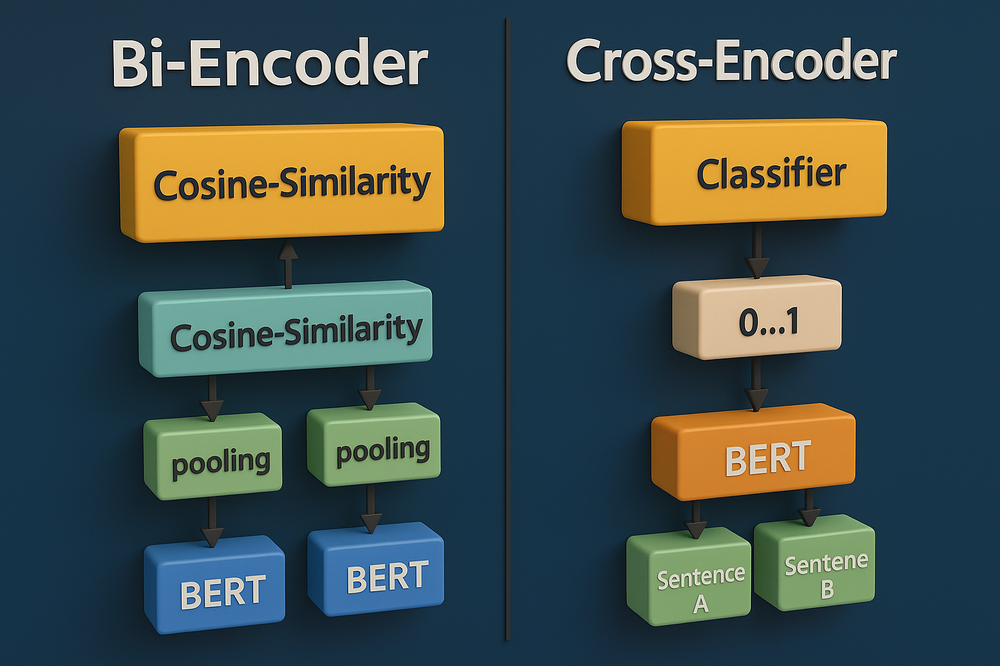

In [42]:
image_path = "/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/Stage_2_Encoder.png"
display(Image(image_path))

🔄 **Re-Ranking in Semantic Search** 🔍

The re-ranking stage is the next step in building a powerful semantic search pipeline. So far, our system returns the top K 📄 documents that seem relevant to a user's query ❓. However, these results may not always be accurate or truly relevant. That’s where re-ranking comes in! 🧠✨

The re-ranking layer reviews the top K results, verifies their relevance ✅, and reorders them based on how well they match the query 🔍📊. It assigns importance scores ⭐ to improve result quality.

✨ **Benefits of Re-Ranking:**

* 🎯 More accurate and relevant answers
* 🚫 Fewer irrelevant or incorrect results
* 👤 More personalized, meaningful responses
* 🛠️ Task/domain-specific search tailoring

Traditionally, methods like Reciprocal Rank Fusion (RRF), hybrid search 🧪, and cross-encoder models 🤖 have been used. For this project, we’ll focus on using **cross-encoders** for re-ranking. 📈

👇 The image below shows how re-ranking fits into the semantic search process.

## 5️⃣ <font color = skyblue> Search - with Cross Encoders System Design

In this design, we enhance the semantic search pipeline by integrating **cross-encoders** to improve the ranking of retrieved results. After the initial retrieval using embeddings (bi-encoders) 🎯, the top-K documents 📄 are passed through a **cross-encoder** model, which evaluates each document alongside the query ❓ to compute a relevance score 📊. 

Unlike bi-encoders that embed queries and documents independently, cross-encoders consider both inputs together, leading to **more precise scoring** and **better re-ranking** ✅. This architecture ensures that the most relevant and contextually accurate information is prioritized for response generation 🧠💬.

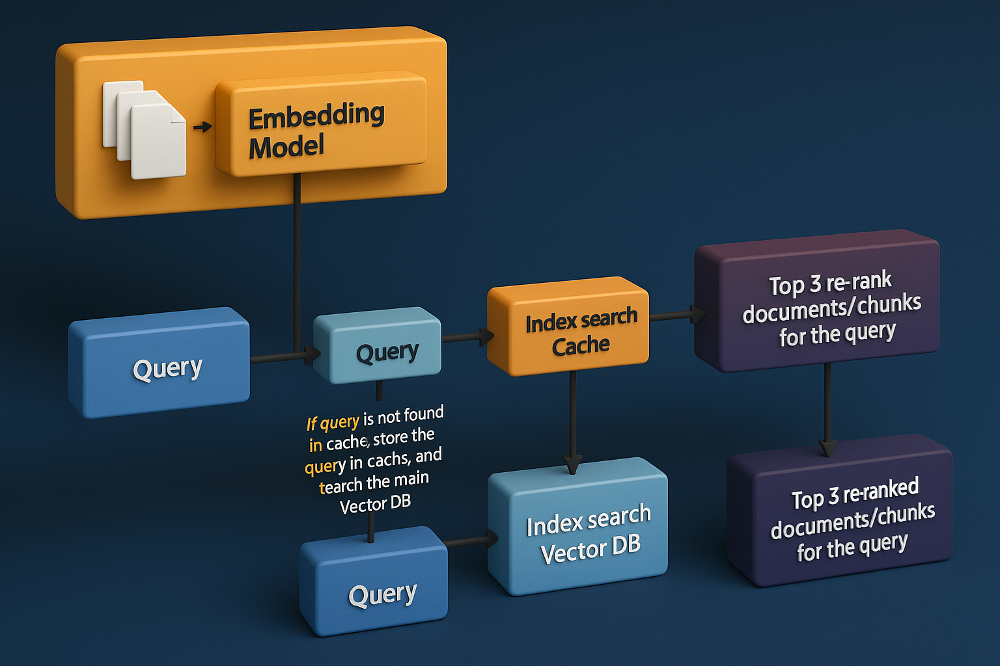

In [43]:
image_path = "/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/Stage_2_Search Layer with Cross Encoders System Design.png"
display(Image(image_path))

In [44]:
results_df

,Metadatas,Documents,Distances,IDs
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section E - Reinstatement Article 1 - Reinstat...,0.706852,37
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section D - Continuation Article 1 - Member Li...,0.725815,35
2,{'Policy_Name': 'Principal-Sample-Life-Insuran...,I f coverage for a Member or Dependent termina...,0.869949,38
3,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi...",Payment of benefits will be subject to the Ben...,0.932137,46
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section B - Effective Dates Article 1 - Member...,0.956336,25
5,{'Policy_Name': 'Principal-Sample-Life-Insuran...,A Member's insurance under this Group Policy f...,0.980352,33
6,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) marriage or establishment of a Civil Union...,1.000119,29
7,"{'Page_No.': 'Page 7', 'Policy_Name': 'Princip...",Section A – Eligibility Member Life Insurance ...,1.011856,4
8,"{'Page_No.': 'Page 37', 'Policy_Name': 'Princi...",b. a business assignment; or c. full-time stud...,1.012933,34
9,"{'Page_No.': 'Page 33', 'Policy_Name': 'Princi...",a . In no event will Dependent Life Insurance ...,1.021472,30


In [45]:
# Import the CrossEncoder library from sentence_transformers
from sentence_transformers import CrossEncoder, util

# Initialise the cross encoder model
cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-12-v2')

config.json:   0%|          | 0.00/791 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.33k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

In [46]:
# Test the cross encoder model

scores = cross_encoder.predict([['Does the insurance cover diabetic patients?', 'The insurance policy covers some pre-existing conditions including diabetes, heart diseases, etc. The policy does not howev'],
                                ['Does the insurance cover diabetic patients?', 'The premium rates for various age groups are given as follows. Age group (<18 years): Premium rate']])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

In [47]:
scores

array([  4.460839, -11.19713 ], dtype=float32)

🔁 **Cross-Encoders: Scoring Explaination** 🧠✨

In earlier versions of **cross-encoders**, the prediction scores typically ranged between **0 and 1**, where **higher values meant stronger similarity**. ✅

🔄 **Now, things have evolved!**
The scores can range from **positive ➕ to negative ➖ values**:

* **➕ Positive scores** → Indicate **high similarity** between the input pair
* **➖ Negative scores** → Suggest **low or no similarity (dissimilarity)**

📝 **Input Format Reminder:**
Cross-encoders expect input as a **list of lists**, where each inner list contains a **\[query, candidate]** pair.

```python
# Example
[
  ["What is AI?", "Artificial intelligence is the simulation of human intelligence by machines."],
  ["What is AI?", "The capital of France is Paris."]
]
```

This format allows the model to evaluate how relevant or similar the two texts are. 🔍

### **Re-rank with Cross Encoder for Query-1**

In [48]:
# Input (query, response) pairs for each of the top 20 responses received from the semantic search to the cross encoder
# Generate the cross_encoder scores for these pairs

cross_inputs = [[query, response] for response in results_df['Documents']]
cross_rerank_scores = cross_encoder.predict(cross_inputs)
cross_rerank_scores

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

array([ 4.2650566,  4.492276 , -1.8442681,  1.4256065, -4.858922 ,
       -2.2509098, -3.0892649, -4.3488407, -8.65608  , -1.5593936],
      dtype=float32)

In [49]:
# Store the rerank_scores in results_df
results_df['Reranked_scores'] = cross_rerank_scores

print("First Query :: ", query , "\n")

results_df

First Query ::  Can insurance coverage continue during an approved leave? 



,Metadatas,Documents,Distances,IDs,Reranked_scores
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section E - Reinstatement Article 1 - Reinstat...,0.706852,37,4.265057
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section D - Continuation Article 1 - Member Li...,0.725815,35,4.492276
2,{'Policy_Name': 'Principal-Sample-Life-Insuran...,I f coverage for a Member or Dependent termina...,0.869949,38,-1.844268
3,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi...",Payment of benefits will be subject to the Ben...,0.932137,46,1.425606
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section B - Effective Dates Article 1 - Member...,0.956336,25,-4.858922
5,{'Policy_Name': 'Principal-Sample-Life-Insuran...,A Member's insurance under this Group Policy f...,0.980352,33,-2.250910
6,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) marriage or establishment of a Civil Union...,1.000119,29,-3.089265
7,"{'Page_No.': 'Page 7', 'Policy_Name': 'Princip...",Section A – Eligibility Member Life Insurance ...,1.011856,4,-4.348841
8,"{'Page_No.': 'Page 37', 'Policy_Name': 'Princi...",b. a business assignment; or c. full-time stud...,1.012933,34,-8.656080
9,"{'Page_No.': 'Page 33', 'Policy_Name': 'Princi...",a . In no event will Dependent Life Insurance ...,1.021472,30,-1.559394


In [50]:
# Return the top 3 results from semantic search
top_3_semantic = results_df.sort_values(by='Distances')
top_3_semantic[:3]

,Metadatas,Documents,Distances,IDs,Reranked_scores
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section E - Reinstatement Article 1 - Reinstat...,0.706852,37,4.265057
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section D - Continuation Article 1 - Member Li...,0.725815,35,4.492276
2,{'Policy_Name': 'Principal-Sample-Life-Insuran...,I f coverage for a Member or Dependent termina...,0.869949,38,-1.844268


In [51]:
# Return the top 3 results after reranking
top_3_rerank = results_df.sort_values(by='Reranked_scores', ascending=False)
top_3_rerank[:3]

,Metadatas,Documents,Distances,IDs,Reranked_scores
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section D - Continuation Article 1 - Member Li...,0.725815,35,4.492276
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section E - Reinstatement Article 1 - Reinstat...,0.706852,37,4.265057
3,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi...",Payment of benefits will be subject to the Ben...,0.932137,46,1.425606


In [52]:
top_3_RAG_query1 = top_3_rerank[["Documents", "Metadatas"]][:3]

top_3_RAG_query1

,Documents,Metadatas
1,Section D - Continuation Article 1 - Member Li...,{'Policy_Name': 'Principal-Sample-Life-Insuran...
0,Section E - Reinstatement Article 1 - Reinstat...,{'Policy_Name': 'Principal-Sample-Life-Insuran...
3,Payment of benefits will be subject to the Ben...,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi..."


### **Re-rank with Cross Encoder for Query-2**

In [53]:
results_df2

,Metadatas,Documents,Distances,IDs
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"(6) If, on the date a Member becomes eligible ...",0.927741,27
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Scheduled Benefit in force for the Member befo...,0.991921,28
2,"{'Page_No.': 'Page 32', 'Policy_Name': 'Princi...",(1) marriage or establishment of a Civil Union...,1.054535,29
3,"{'Page_No.': 'Page 46', 'Policy_Name': 'Princi...",PART IV - BENEFITS Section A - Member Life Ins...,1.094952,43
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) If termination is as described in b. (1) a...,1.101119,42
5,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Coverage During Disability will cease on the e...,1.105354,48
6,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section C - Dependent Life Insurance Article 1...,1.116788,56
7,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) the child is incapable of self-support as ...,1.140166,36
8,"{'Page_No.': 'Page 33', 'Policy_Name': 'Princi...",a . In no event will Dependent Life Insurance ...,1.146286,30
9,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) only one Accelerated Benefit payment will ...,1.152514,49


In [54]:
# Input (query, response) pairs for each of the top 20 responses received from the semantic search to the cross encoder
# Generate the cross_encoder scores for these pairs

cross_inputs2 = [[query2, response] for response in results_df2['Documents']]
cross_rerank_scores2 = cross_encoder.predict(cross_inputs2)
cross_rerank_scores2

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

array([  2.2361574,  -1.4793499,  -6.5178785,  -0.9980295,  -7.9971633,
        -5.5509777,  -4.174706 , -10.825476 ,  -5.99903  ,  -3.67735  ],
      dtype=float32)

In [55]:
# Store the rerank_scores in results_df
results_df2['Reranked_scores'] = cross_rerank_scores2

print("Second Query :: ", query2 , "\n")

results_df2

Second Query ::  Are there age-based reductions in benefit amounts? 



,Metadatas,Documents,Distances,IDs,Reranked_scores
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"(6) If, on the date a Member becomes eligible ...",0.927741,27,2.236157
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Scheduled Benefit in force for the Member befo...,0.991921,28,-1.479350
2,"{'Page_No.': 'Page 32', 'Policy_Name': 'Princi...",(1) marriage or establishment of a Civil Union...,1.054535,29,-6.517879
3,"{'Page_No.': 'Page 46', 'Policy_Name': 'Princi...",PART IV - BENEFITS Section A - Member Life Ins...,1.094952,43,-0.998029
4,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) If termination is as described in b. (1) a...,1.101119,42,-7.997163
5,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Coverage During Disability will cease on the e...,1.105354,48,-5.550978
6,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Section C - Dependent Life Insurance Article 1...,1.116788,56,-4.174706
7,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) the child is incapable of self-support as ...,1.140166,36,-10.825476
8,"{'Page_No.': 'Page 33', 'Policy_Name': 'Princi...",a . In no event will Dependent Life Insurance ...,1.146286,30,-5.999030
9,{'Policy_Name': 'Principal-Sample-Life-Insuran...,(1) only one Accelerated Benefit payment will ...,1.152514,49,-3.677350


In [56]:
# Return the top 3 results from semantic search
top_3_semantic2_query2 = results_df2.sort_values(by='Distances')
top_3_semantic2_query2[:3]

,Metadatas,Documents,Distances,IDs,Reranked_scores
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"(6) If, on the date a Member becomes eligible ...",0.927741,27,2.236157
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Scheduled Benefit in force for the Member befo...,0.991921,28,-1.479350
2,"{'Page_No.': 'Page 32', 'Policy_Name': 'Princi...",(1) marriage or establishment of a Civil Union...,1.054535,29,-6.517879


In [57]:
# Return the top 3 results after reranking
top_3_rerank_query2 = results_df2.sort_values(by='Reranked_scores', ascending=False)
top_3_rerank_query2[:3]

,Metadatas,Documents,Distances,IDs,Reranked_scores
0,{'Policy_Name': 'Principal-Sample-Life-Insuran...,"(6) If, on the date a Member becomes eligible ...",0.927741,27,2.236157
3,"{'Page_No.': 'Page 46', 'Policy_Name': 'Princi...",PART IV - BENEFITS Section A - Member Life Ins...,1.094952,43,-0.998029
1,{'Policy_Name': 'Principal-Sample-Life-Insuran...,Scheduled Benefit in force for the Member befo...,0.991921,28,-1.479350


In [58]:
top_3_RAG_query2 = top_3_rerank_query2[["Documents", "Metadatas"]][:3]

top_3_RAG_query2

,Documents,Metadatas
0,"(6) If, on the date a Member becomes eligible ...",{'Policy_Name': 'Principal-Sample-Life-Insuran...
3,PART IV - BENEFITS Section A - Member Life Ins...,"{'Page_No.': 'Page 46', 'Policy_Name': 'Princi..."
1,Scheduled Benefit in force for the Member befo...,{'Policy_Name': 'Principal-Sample-Life-Insuran...


### **Re-rank with Cross Encoder for Query-3**

In [59]:
results_df3

,IDs,Documents,Distances,Metadatas
0,5,"f . claim requirements listed in PART IV, Sect...",0.9224141836166382,{'Policy_Name': 'Principal-Sample-Life-Insuran...
1,48,Coverage During Disability will cease on the e...,0.9766375422477722,"{'Page_No.': 'Page 8', 'Policy_Name': 'Princip..."
2,52,Section A – Eligibility Member Life Insurance ...,0.8257278203964233,{'Policy_Name': 'Principal-Sample-Life-Insuran...
3,46,Section B - Member Accidental Death and Dismem...,0.9571272730827332,"{'Page_No.': 'Page 58', 'Policy_Name': 'Princi..."
4,54,Payment of benefits will be subject to the Ben...,0.9208610653877258,{'Policy_Name': 'Principal-Sample-Life-Insuran...
5,4,% of Scheduled Covered Loss Benefit Loss of Sp...,0.9734508991241455,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi..."
6,51,"a. willful self-injury or self-destruction, wh...",0.9567238688468933,"{'Page_No.': 'Page 51', 'Policy_Name': 'Princi..."
7,50,"If a Member sustains an injury, and as a resul...",0.8660002946853638,{'Policy_Name': 'Principal-Sample-Life-Insuran...
8,53,Exposure Exposure to the elements will be pres...,0.982839822769165,{'Policy_Name': 'Principal-Sample-Life-Insuran...
9,55,Section A - Member Life Insurance Schedule of ...,0.8787118792533875,"{'Page_No.': 'Page 57', 'Policy_Name': 'Princi..."


In [60]:
# Input (query, response) pairs for each of the top 20 responses received from the semantic search to the cross encoder
# Generate the cross_encoder scores for these pairs
cross_inputs3 = [[query3, response] for response in results_df3['Documents']]
cross_rerank_scores3 = cross_encoder.predict(cross_inputs3)
cross_rerank_scores3

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

array([ -3.4060597 , -10.266796  ,  -1.2106388 ,   0.40420592,
         0.2372373 ,  -3.5169964 ,  -2.756032  ,  -1.6128452 ,
         0.03237037,  -1.6799722 ], dtype=float32)

In [61]:
# Store the rerank_scores in results_df
results_df3['Reranked_scores'] = cross_rerank_scores3

print("Third Query :: ", query3 , "\n")

results_df3

Third Query ::  What are the policy exclusions under Accidental Death insurance? 



,IDs,Documents,Distances,Metadatas,Reranked_scores
0,5,"f . claim requirements listed in PART IV, Sect...",0.9224141836166382,{'Policy_Name': 'Principal-Sample-Life-Insuran...,-3.406060
1,48,Coverage During Disability will cease on the e...,0.9766375422477722,"{'Page_No.': 'Page 8', 'Policy_Name': 'Princip...",-10.266796
2,52,Section A – Eligibility Member Life Insurance ...,0.8257278203964233,{'Policy_Name': 'Principal-Sample-Life-Insuran...,-1.210639
3,46,Section B - Member Accidental Death and Dismem...,0.9571272730827332,"{'Page_No.': 'Page 58', 'Policy_Name': 'Princi...",0.404206
4,54,Payment of benefits will be subject to the Ben...,0.9208610653877258,{'Policy_Name': 'Principal-Sample-Life-Insuran...,0.237237
5,4,% of Scheduled Covered Loss Benefit Loss of Sp...,0.9734508991241455,"{'Page_No.': 'Page 49', 'Policy_Name': 'Princi...",-3.516996
6,51,"a. willful self-injury or self-destruction, wh...",0.9567238688468933,"{'Page_No.': 'Page 51', 'Policy_Name': 'Princi...",-2.756032
7,50,"If a Member sustains an injury, and as a resul...",0.8660002946853638,{'Policy_Name': 'Principal-Sample-Life-Insuran...,-1.612845
8,53,Exposure Exposure to the elements will be pres...,0.982839822769165,{'Policy_Name': 'Principal-Sample-Life-Insuran...,0.032370
9,55,Section A - Member Life Insurance Schedule of ...,0.8787118792533875,"{'Page_No.': 'Page 57', 'Policy_Name': 'Princi...",-1.679972


In [62]:
# Return the top 3 results from semantic search
top_3_semantic_query3 = results_df3.sort_values(by='Distances')
top_3_semantic_query3[:3]

,IDs,Documents,Distances,Metadatas,Reranked_scores
2,52,Section A – Eligibility Member Life Insurance ...,0.8257278203964233,{'Policy_Name': 'Principal-Sample-Life-Insuran...,-1.210639
7,50,"If a Member sustains an injury, and as a resul...",0.8660002946853638,{'Policy_Name': 'Principal-Sample-Life-Insuran...,-1.612845
9,55,Section A - Member Life Insurance Schedule of ...,0.8787118792533875,"{'Page_No.': 'Page 57', 'Policy_Name': 'Princi...",-1.679972


In [63]:
# Return the top 3 results after reranking
top_3_rerank_query3 = results_df3.sort_values(by='Reranked_scores', ascending=False)
top_3_rerank_query3[:3]

,IDs,Documents,Distances,Metadatas,Reranked_scores
3,46,Section B - Member Accidental Death and Dismem...,0.9571272730827332,"{'Page_No.': 'Page 58', 'Policy_Name': 'Princi...",0.404206
4,54,Payment of benefits will be subject to the Ben...,0.9208610653877258,{'Policy_Name': 'Principal-Sample-Life-Insuran...,0.237237
8,53,Exposure Exposure to the elements will be pres...,0.982839822769165,{'Policy_Name': 'Principal-Sample-Life-Insuran...,0.032370


In [64]:
top_3_RAG_query3 = top_3_rerank_query3[["Documents", "Metadatas"]][:3]

top_3_RAG_query3

,Documents,Metadatas
3,Section B - Member Accidental Death and Dismem...,"{'Page_No.': 'Page 58', 'Policy_Name': 'Princi..."
4,Payment of benefits will be subject to the Ben...,{'Policy_Name': 'Principal-Sample-Life-Insuran...
8,Exposure Exposure to the elements will be pres...,{'Policy_Name': 'Principal-Sample-Life-Insuran...


# 🧠 Stage 3 – Generation Layer 💬

In this stage, the top search results 📄 and the user's query ❓ are sent to a Large Language Model (LLM) 🤖 like GPT-4o. The model uses a well-crafted prompt ✍️ to generate a natural, accurate response 📢. Instead of returning full pages or chunks 📚, it delivers concise answers with citations 📎. This layer benefits greatly from prompt engineering 🛠️, custom instructions 📋, and techniques like Retrieval-Augmented Generation (RAG) 🔍➕📖. The goal is to provide smart, direct, and context-aware replies 🎯, making the user experience faster, clearer, and more helpful 🚀.


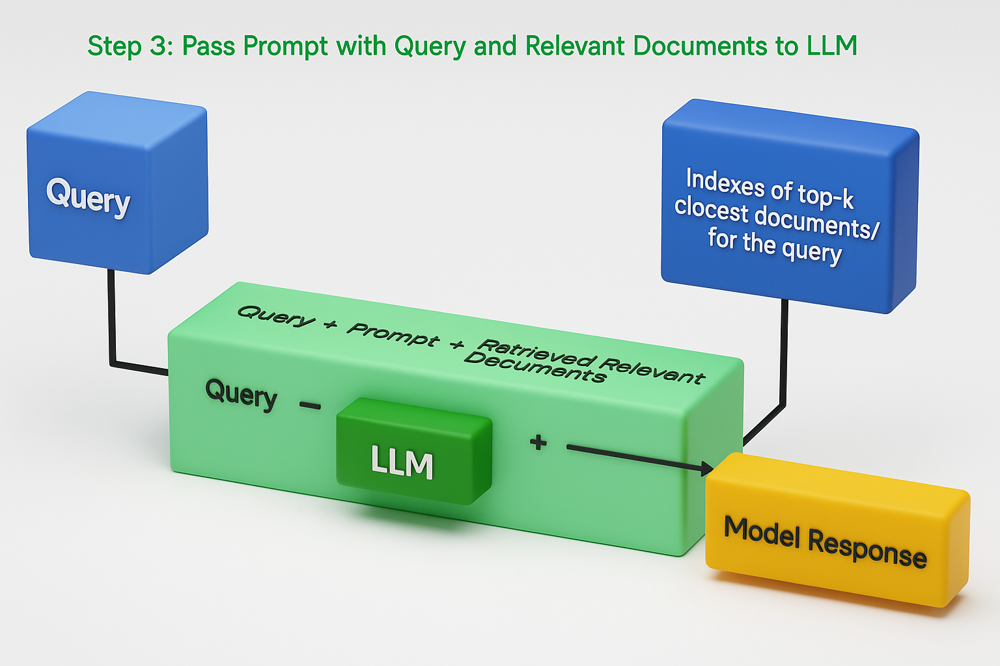

In [65]:
image_path = "/kaggle/input/flowchart-diagram-demonstrates-helpmate-ai-project/Stage_3_Generation Layer.png"
display(Image(image_path))

Generation Layer

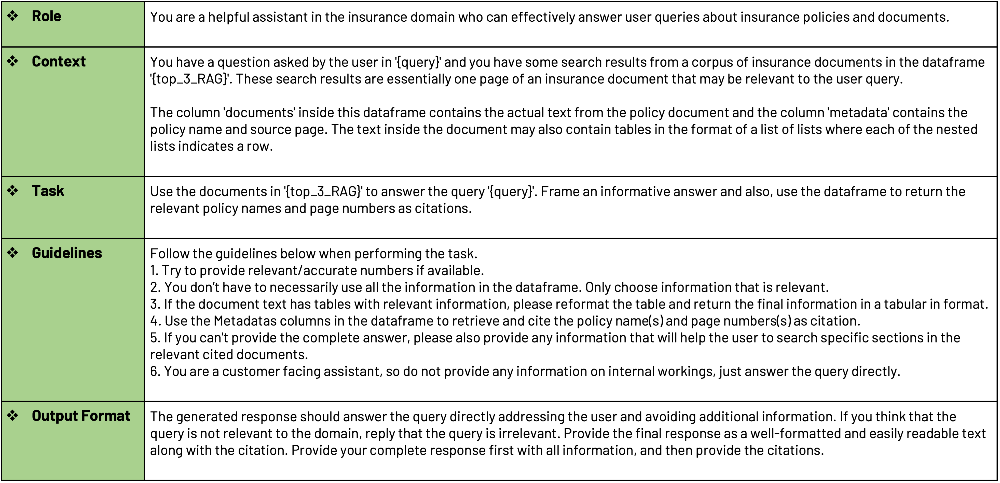

In [66]:
# # Define the function to generate the response. Provide a comprehensive prompt that passes the user query and the top 3 results to the model

# def generate_response(query, top_3_RAG):
#     """
#     Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
#     """
#     messages = [
#                 {"role": "system", "content":  "You are a helpful assistant in the insurance domain who can effectively answer user queries about insurance policies and documents."},
#                 {"role": "user", "content": f"""You are a helpful assistant in the insurance domain who can effectively answer user queries about insurance policies and documents.
#                                                 You have a question asked by the user in '{query}' and you have some search results from a corpus of insurance documents in the dataframe '{top_3_RAG}'. These search results are essentially one page of an insurance document that may be relevant to the user query.

#                                                 The column 'documents' inside this dataframe contains the actual text from the policy document and the column 'metadata' contains the policy name and source page. The text inside the document may also contain tables in the format of a list of lists where each of the nested lists indicates a row.

#                                                 Use the documents in '{top_3_RAG}' to answer the query '{query}'. Frame an informative answer and also, use the dataframe to return the relevant policy names and page numbers as citations.

#                                                 Follow the guidelines below when performing the task.
#                                                 1. Try to provide relevant/accurate numbers if available.
#                                                 2. You don’t have to necessarily use all the information in the dataframe. Only choose information that is relevant.
#                                                 3. If the document text has tables with relevant information, please reformat the table and return the final information in a tabular in format.
#                                                 3. Use the Metadatas columns in the dataframe to retrieve and cite the policy name(s) and page numbers(s) as citation.
#                                                 4. If you can't provide the complete answer, please also provide any information that will help the user to search specific sections in the relevant cited documents.
#                                                 5. You are a customer facing assistant, so do not provide any information on internal workings, just answer the query directly.

#                                                 The generated response should answer the query directly addressing the user and avoiding additional information. If you think that the query is not relevant to the document, reply that the query is irrelevant. Provide the final response as a well-formatted and easily readable text along with the citation. Provide your complete response first with all information, and then provide the citations.
#                                                 """},
#               ]

#     response = openai.chat.completions.create(
#         model="gpt-4o-mini",
#         messages=messages
#     )

#     return response.choices[0].message.content.split('\n')

In [67]:
def generate_response(query, top_3_RAG):
    """
    Generate a response using GPT-4o-mini's ChatCompletion based on the user query and top 3 retrieved insurance document chunks.
    """
    # Convert the DataFrame into a readable text block with each entry clearly marked
    document_text = ""
    for idx, row in top_3_RAG.iterrows():
        document_text += (
            f"\n---\nDocument #{idx+1}\n"
            f"Policy Name & Page: {row['Metadatas']}\n"  # ✅ Corrected here
            f"Content:\n{row['Documents']}\n"
        )

    messages = [
        {
            "role": "system",
            "content": (
                "You are an expert assistant in the insurance domain. You accurately answer user questions using provided excerpts "
                "from insurance policy documents. Always try to be helpful, clear, and provide relevant citations."
            )
        },
        {
            "role": "user",
            "content": f"""
You are helping answer a customer question: **{query}**

Below are 3 potentially relevant insurance document excerpts. Each document contains the policy text and its metadata (policy name and page number). Use only the information relevant to the query.

{document_text}

Instructions:
1. Review all 3 documents to find information that helps answer the query.
2. If useful information is inside a table (formatted as a list of lists), convert it into a readable table.
3. Answer the question clearly and concisely using relevant content only.
4. At the end of your response, list all cited policies and their page numbers in a "Citations" section.
5. If no documents are useful, say: “None of the provided documents contain relevant details to answer your query.”
6. Do not include any technical, implementation, or system details — only answer the query.

Respond only with the final answer and citations. Do not explain your reasoning or repeat instructions.
"""
        }
    ]

    response = openai.chat.completions.create(
        model="gpt-4o-mini",
        messages=messages
    )

    return response.choices[0].message.content.split('\n')

In [68]:
# Generate the response - For Query 1
response = generate_response(query, top_3_RAG_query1)
print("-"*80,"\n","-"*78)
print("Query 1: ",query)
print("-"*80,"\n","-"*78,"\n")

# Print the response
print("\n".join(response))

-------------------------------------------------------------------------------- 
 ------------------------------------------------------------------------------
Query 1:  Can insurance coverage continue during an approved leave?
-------------------------------------------------------------------------------- 
 ------------------------------------------------------------------------------ 

Yes, insurance coverage can continue during an approved leave of absence. According to the policy excerpt, if active work ends because a member is on layoff or an approved leave of absence, their insurance may be continued until the earliest of: 

1. The date insurance would otherwise cease.
2. The date the leave of absence ends.
3. The date the member becomes eligible for any other group life coverage.
4. One month after the date active work ends.

Additionally, if a member's leave of absence is due to the Family and Medical Leave Act (FMLA), the policyholder may choose to continue the member's ins

In [69]:
# Generate the response - For Query 2
response2 = generate_response(query2, top_3_RAG_query2)
print("-"*80,"\n","-"*78)
print("Query 2: ",query2)
print("-"*80,"\n","-"*78,"\n")

# Print the response
print("\n".join(response2))

-------------------------------------------------------------------------------- 
 ------------------------------------------------------------------------------
Query 2:  Are there age-based reductions in benefit amounts?
-------------------------------------------------------------------------------- 
 ------------------------------------------------------------------------------ 

Yes, there are age-based reductions in benefit amounts. According to the policy, the amount of a Member's insurance will be reduced based on their age as follows:

| Age Range                  | % of Scheduled Benefit |
|----------------------------|------------------------|
| Age 70 but less than age 75 | 65%                    |
| Age 75 and over            | 45%                    |

Citations:
- Principal-Sample-Life-Insurance-Policy, Page 46


In [70]:
# Generate the response - For Query 3
response3 = generate_response(query3, top_3_RAG_query3)
print("-"*80,"\n","-"*78)
print("Query 3: ",query3)
print("-"*80,"\n","-"*78,"\n")

# Print the response
print("\n".join(response3))

-------------------------------------------------------------------------------- 
 ------------------------------------------------------------------------------
Query 3:  What are the policy exclusions under Accidental Death insurance?
-------------------------------------------------------------------------------- 
 ------------------------------------------------------------------------------ 

The policy exclusions under Accidental Death insurance specified in the excerpts include the following key requirements for benefit qualification:

1. The injury must be through external, violent, and accidental means.
2. The injury must be the direct and sole cause of a loss listed in the insurance policy.
3. The loss must occur within 365 days of the injury.
4. Limitations listed in the policy must not apply.

Specific exclusions that are typically outlined in other sections of an insurance policy may not be directly mentioned in the provided documents, but ensure that all conditions are me

# ✅ Conclusion

**Mr.HelpMate AI** 🤖 represents a transformative step forward in how policyholders interact with complex insurance documents 📄. By combining the power of semantic search 🔍, retrieval-augmented generation (RAG) 📚➕🧠, and large language models 🗣️, the system empowers users to get fast, accurate, and easy-to-understand answers to their specific questions ❓—without the frustration of navigating through dense paperwork or enduring long customer service waits ⏳📞.

This intelligent assistant not only enhances customer satisfaction 😊 but also significantly reduces operational overhead for insurance providers 💼📉. Its modular architecture—spanning document processing, retrieval, and generative response layers—ensures scalability, adaptability, and precision 🎯.

Moreover, the learnings and architecture of **Mr.HelpMate AI** pave the way for applications in other domains such as legal tech ⚖️, finance 💰, and enterprise knowledge management 🏢. With a focus on factual accuracy, personalized interactions, and seamless user experience, this solution demonstrates the practical value of AI in solving real-world, document-heavy challenges 🚀.

**Mr.HelpMate AI** isn't just a tool—it's a step toward smarter, more human-centric digital experiences 🌐✨.
